# Лаборатная работа 1
## Загрузка и обработка приложений

### Загрузка изображений

Читаю изображения с помощью функции imread и проверяю, всё ли на месте. Соберу всю в массив images, чтобы по возможности поменьше повторяться.

Потом я пишу функцию для показа изображений на основе matplotlib, предварительно переведя из BRG в RGB, чтобы всё не выглядело по инопланетянски.

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

tomatoes_img = cv2.imread('./images/tomatoes.jpg')
street_img = cv2.imread('./images/street.jfif')
dog_img = cv2.imread('./images/pes.jfif')

images = [tomatoes_img, street_img, dog_img]
titles = ['Помидоры', 'Улица', 'Пееес']

for img in images:
    if img is None:
        print('А где...')
    else:
        print('Что-то да есть')

Что-то да есть
Что-то да есть
Что-то да есть


In [3]:
def show_images(images, titles=None, cols=3, figsize=(12, 4)):
    """
    Отображает список изображений (цветных или grayscale) в сетке.

    Параметры:
    ----------
    images : list
        Список изображений (в формате BGR, RGB или grayscale).
    titles : list[str]
        Заголовки для каждого изображения (может быть None).
    cols : int
        Количество столбцов для вывода.
    figsize : tuple
        Размер всей фигуры matplotlib (ширина, высота).
    """

    n = len(images)
    rows = (n + cols - 1) // cols

    plt.figure(figsize=figsize)

    for i, img in enumerate(images):
        plt.subplot(rows, cols, i + 1)

        if img is None:
            plt.text(0.5, 0.5, "⚠️ None", ha="center", va="center", fontsize=12)
            plt.axis("off")
            continue

        # Если изображение цветное (3 канала)
        if len(img.shape) == 3:
            # OpenCV загружает в BGR — меняем порядок на RGB
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.imshow(img_rgb)
        else:
            # grayscale (2D)
            plt.imshow(img, cmap='gray')

        if titles and i < len(titles):
            plt.title(titles[i])
        plt.axis('off')

    plt.tight_layout()
    plt.show()


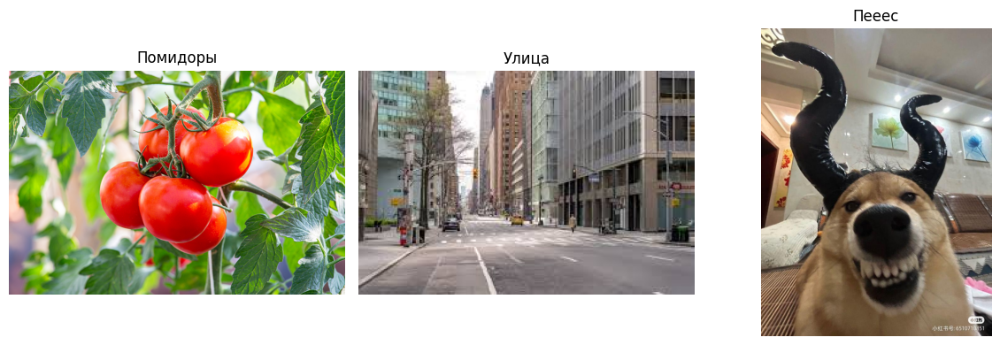

In [4]:
show_images(images, titles)

### Преобразование в оттенки серого

Погнали. Первый способ - усреднение каналов. Надо пройтись по каждому пикселёчку, взять значения каналов R, G, B и найти их среднее значение и заменить на него значения всех каналов. С этим отлично справится функция mean из пакета numpy. Работать будем на 2 оси, так как на 0 строка, а на 1 столбцы. Это значение будет во float, поэтому надо будет перевести его в int.

С помощью ранее написанной функции выведем весь этот траур на экран.

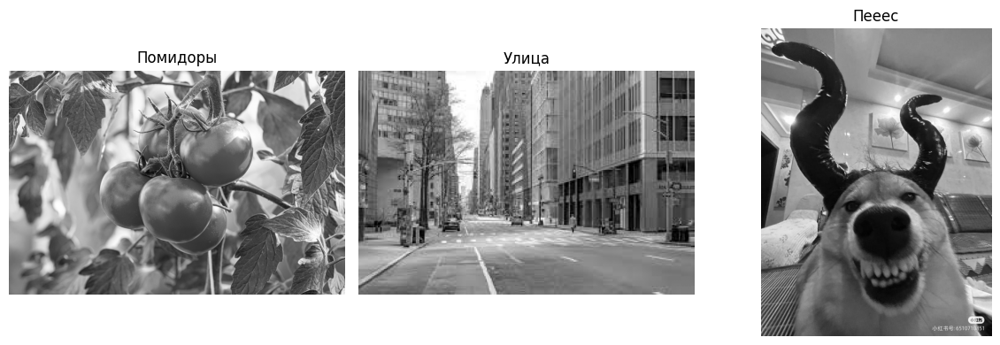

In [5]:
images_bw = []

for img in images:
    if img is not None:
        gray = np.mean(img, axis=2).astype(np.uint8)
        images_bw.append(gray)

show_images(images_bw, titles)

Второй способ - через модель HSV. H - цвет, S - насыщенность, V - яркость. Просто переведём изображения в этот формат и выведем насыщенность и цвет в 0, оставив только яркость. Для этого используем функцию split, чтобы управлять каналами по отдельности.

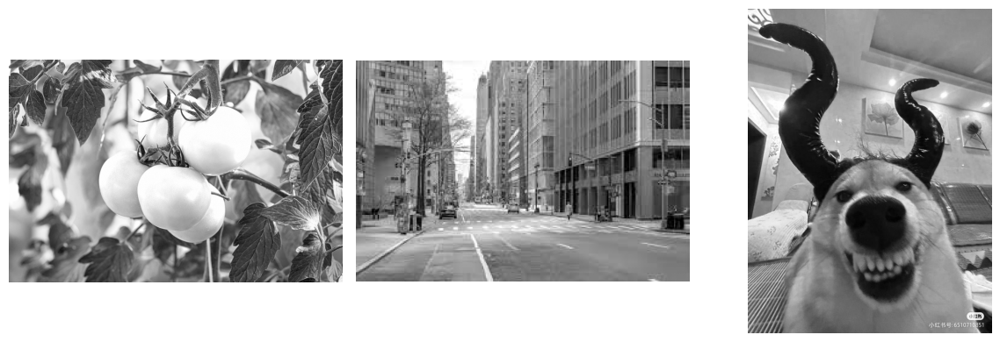

In [6]:
images_bw_hsv = []

for img in images:
    hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(img)
    images_bw_hsv.append(v)

show_images(images_bw_hsv)

### Бинаризация

Делаем пиксели либо черными, либо белыми, а где будет порог - решит Отсу. Для этого исопльзуем функцию threshold, который вернет значение порога и само изображение. Туда передадим ранее созданные чб изображения, 255 как максимальное значение (белый) и то, что мы будем находить порог с помощью метода Отсу, а не проставлять самостоятельно.

Порог:  140.0
Порог:  125.0
Порог:  102.0


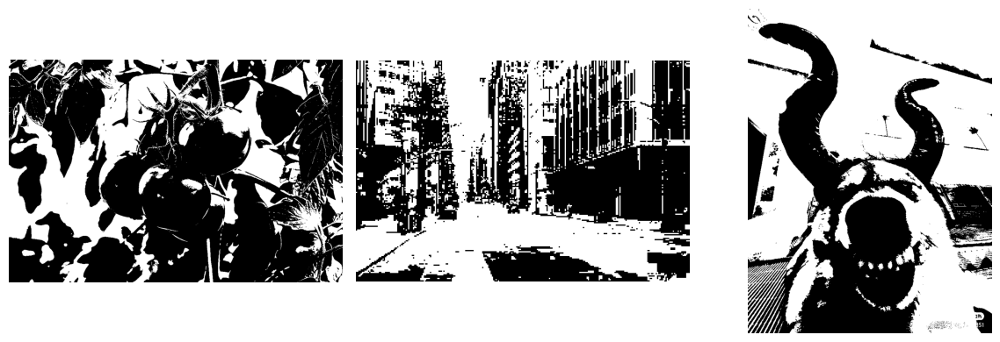

In [7]:
binary_images = []

for img in images_bw:
    thresh_val, binary_otsu = cv2.threshold(img, 0, 255, cv2.THRESH_OTSU)
    binary_images.append(binary_otsu)
    print('Порог: ', thresh_val)

show_images(binary_images)

### Нормализация, эквализация, растяжение гистограммы

Нормализация, эквализация, растяжение гистограммы - способы улучшения изображения. Сама гистограмма показывает распределение уровня яркости пикселей от 0 до 255. Если в гистограмме всё более менее распределено равномерно, значит, изображение клёвое контрастное, а если значения сосредоточены в одной области - разобрать происходящее сложнее. 

Начнём с нормализации - можно сказать, мы просто "растягиваем" гистограмму. В openCV это делается с помощью функции normalize. Используем линейное растяжение и диапазон от 0 до 255.

Для простоты сравнения с вывела сначала оригинал, потом нормализованные картинки. Они стали чуть контрастнее.

In [8]:
def show_histograms(images, titles=None):
    n = len(images)
    plt.figure(figsize=(12, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.hist(images[i].ravel(), bins=256, range=[0, 256], color='gray')
        if titles:
            plt.title(titles[i])
        else:
            plt.title(f"Гистограмма {i+1}")
        plt.xlabel('Яркость пикселя')
        plt.ylabel('Кол-во пикселей')
    plt.tight_layout()
    plt.show()

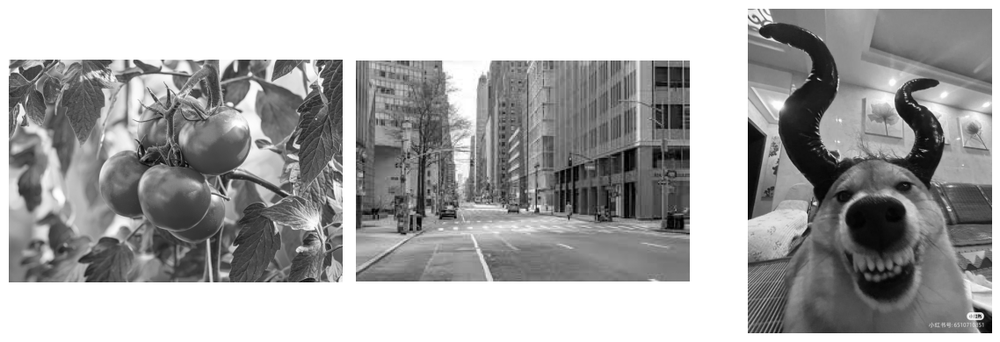

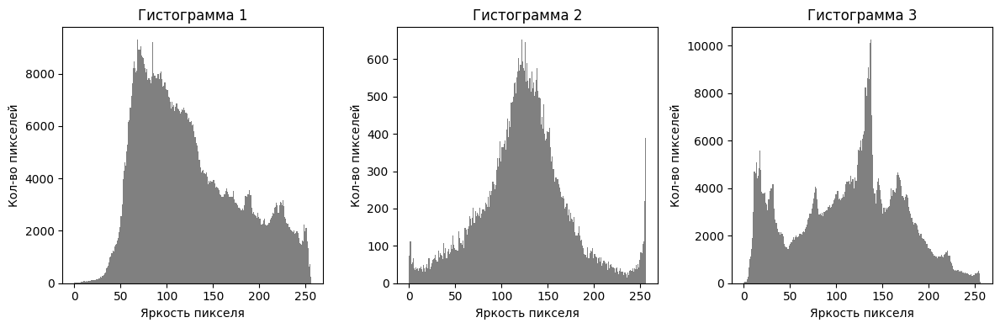

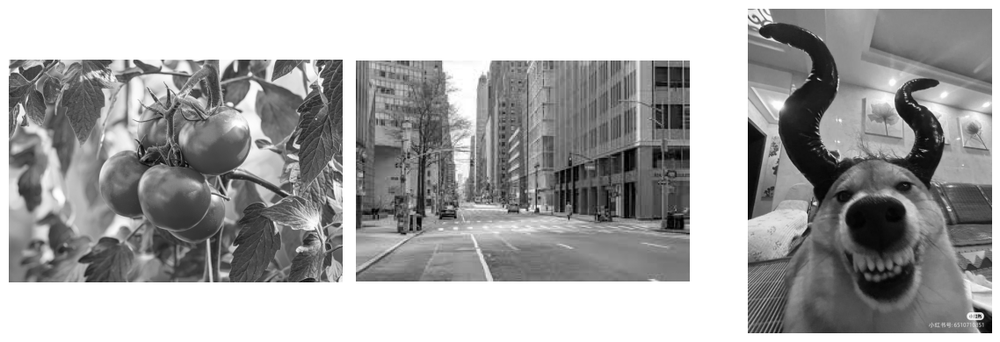

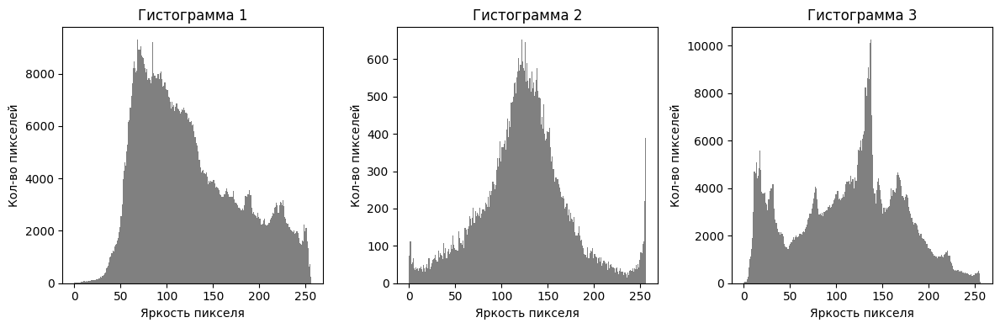

In [9]:
normalized_images = []

for img in images_bw:
    normalized = cv2.normalize(img, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    normalized_images.append(normalized)

show_images(images_bw)
show_histograms(images_bw)
show_images(normalized_images)
show_histograms(normalized_images)

Растяжение - насколько я поняла, такой же концепт, но тут можно самостоятельно выбирать диапазон и растягивать куски выборочно. Делается по формуле без функции в библиотеке.

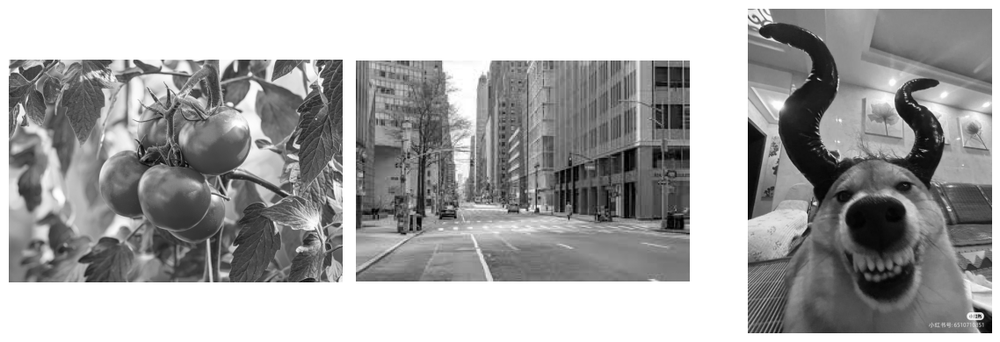

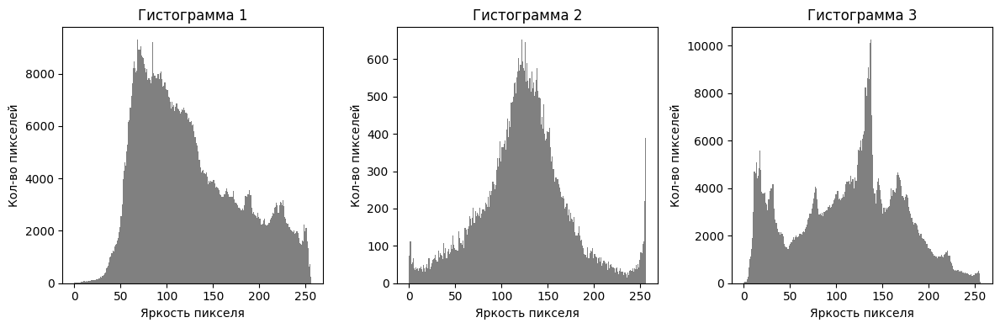

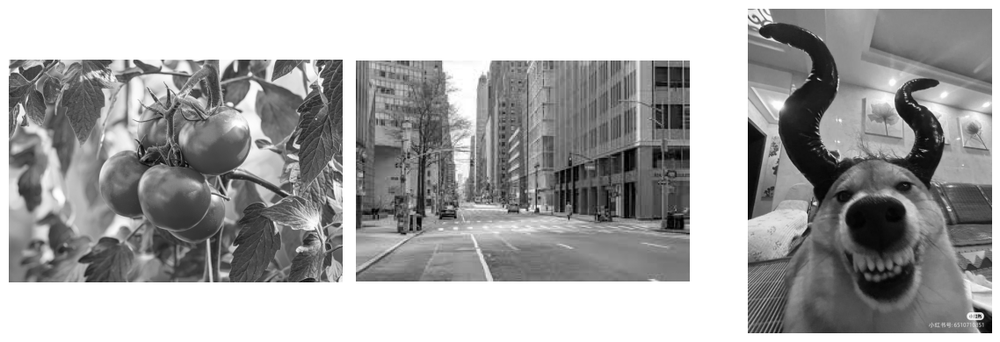

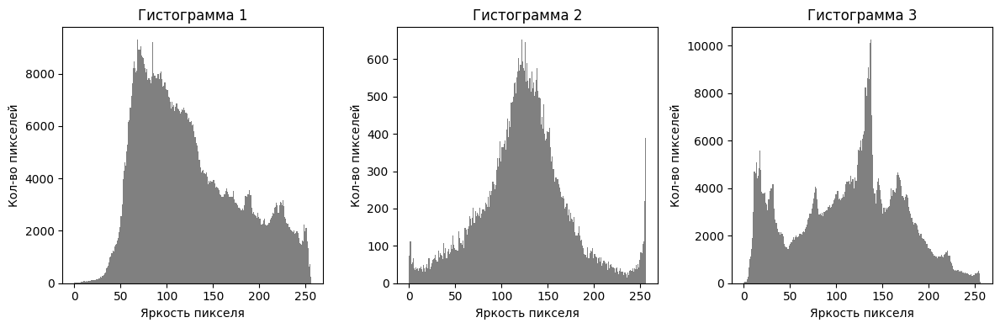

In [10]:
stretched_images = []

for img in images_bw:
    min_val = np.min(img)
    max_val = np.max(img)
    stretched = ((img - min_val) / (max_val - min_val) * 255).astype(np.uint8)
    stretched_images.append(stretched)

show_images(images_bw)
show_histograms(images_bw)
show_images(stretched_images)
show_histograms(stretched_images)

Последний метод - эквализация, чуть более хитрый. Он вычисляет гитограмму и находит кумулятивную функцию распределения, после чего перераспределяет яркость. Он, слава богу, находится под капотом openCV в методе equalizeHist. 

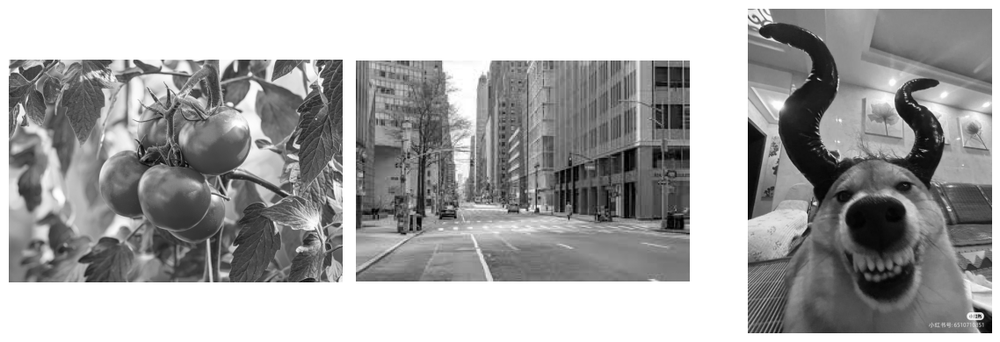

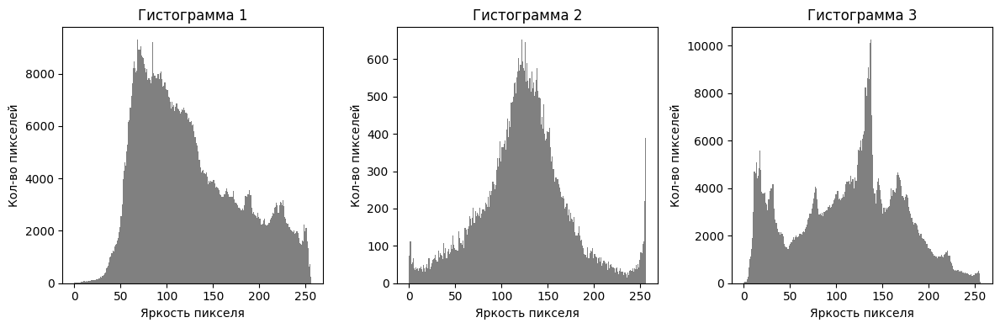

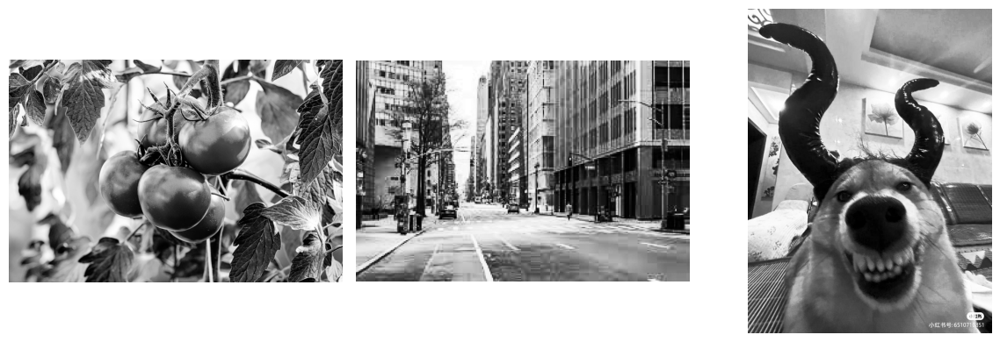

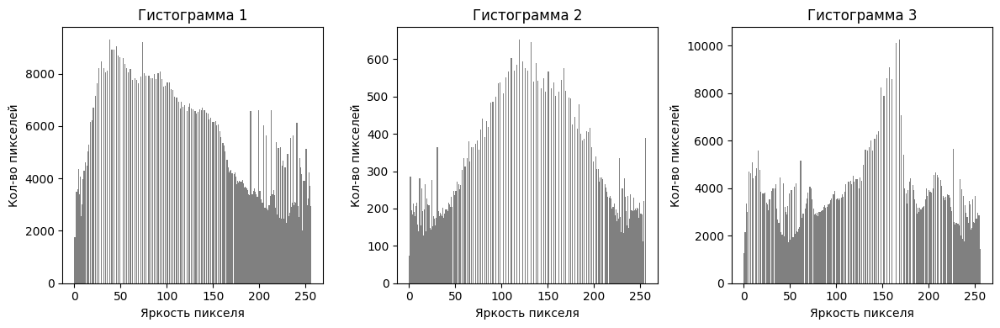

In [11]:
equalized_images = []

for img in images_bw:
    equalized = cv2.equalizeHist(img)
    equalized_images.append(equalized)

show_images(images_bw)
show_histograms(images_bw)
show_images(equalized_images)
show_histograms(equalized_images)

## Операции свёртки с различными масками

### Размытие (Гауссиан)

Гауссово размытие нужно для того, чтобы сделать изображение более гладким, уменьшив количество шума. Используется фильтр, основанный на нормальном (гауссовом) распределении — “колокольчик”. Каждый пиксель заменяется взвешенным средним его соседей. Пиксели ближе к центру имеют больший вес (влияют сильнее), дальние — меньше. В openCV это делается с помощью функции GaussianBlur. В функции есть 2 важных параметра, влияющие на силу размытия - размер ядра (сколько пикселей в окрестности будут влиять на этот пиксель) и sigma - то, насколько быстро веса уменьшаются от центра к краю.

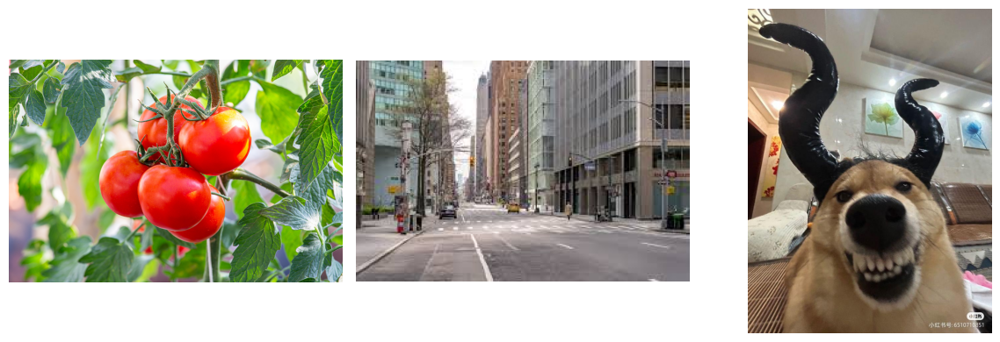

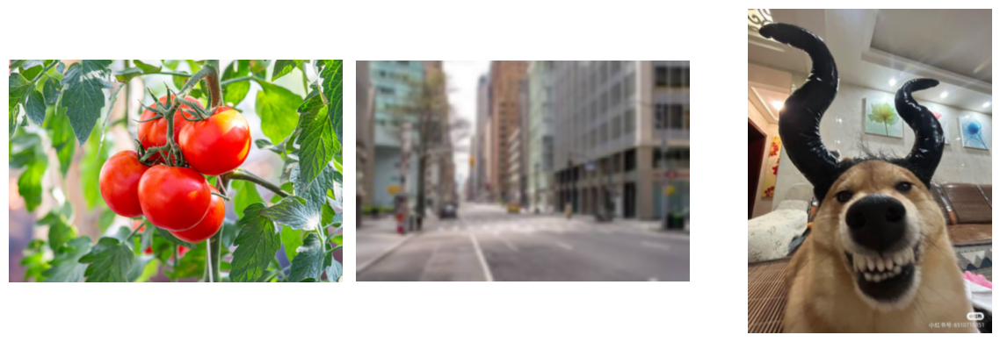

In [12]:
blurred_images = []

for img in images:
    blur = cv2.GaussianBlur(img, (7, 7), 1.5)
    blurred_images.append(blur)

show_images(images)
show_images(blurred_images)

### Повышение четкости (Лаплассиан и его производные)

Теперь мы наоборот хотим сделать изображение более четким. Для этого мы хотим найти, где яркость изображения меняется (контуры) и сделать их более контрастными. Для этого надо найти места резких изменений в изменении яркости, т.е. вторую производную. Используем функцию Laplacian из openCV. Там есть 2 параметра - ddepth (глубина выходного изображения) и ksize. Это размер ядра (1, 3, 5). Чем больше — тем сильнее “реагирует” на шум. Альфа - коэффициент усиления. После неё избавляемся от отрицательных значений и приводит к инту с помощью convertScaleAbs.

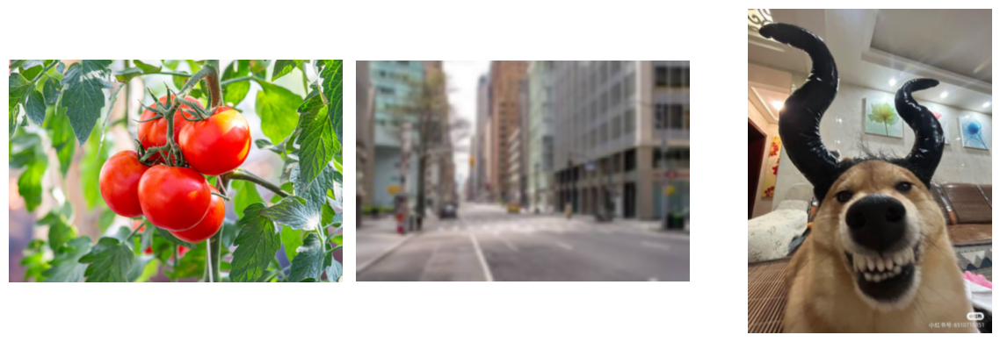

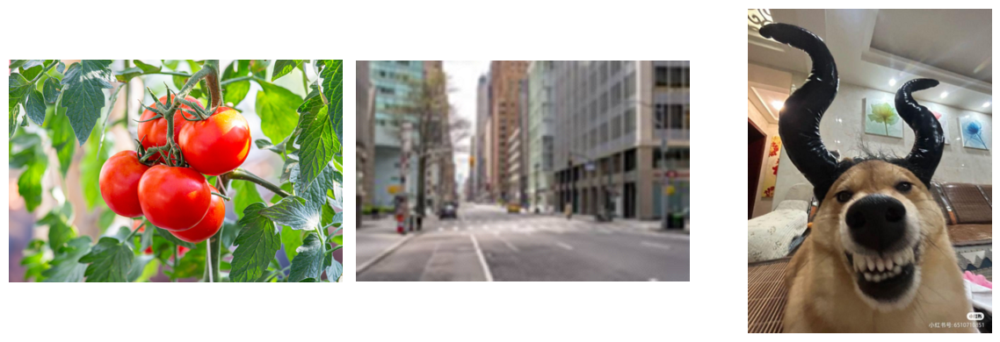

In [13]:
sharp_images = []
alpha = 1.0

for img in blurred_images:
    lap = cv2.Laplacian(img, cv2.CV_64F)
    sharp = cv2.convertScaleAbs(img - alpha * lap)
    sharp_images.append(sharp)

show_images(blurred_images)
show_images(sharp_images)

### Выделение краёв (оператор Собеля)

Тут мы хотим найти границы и контур объектов. Для этого смотрим, как меняется яркость с помощью производной. Затем мы берем специальные матрицы свертки, которые умножаются (сворачиваются) с изображением,
и в результате получаем два новых изображения - где контуры по вертикали и по горизонтали. Для этого в openCV есть функция Sobel, в которую передаются глубина выходных данных (cv2.CV_64F, чтобы не терять отрицательные значения), порядок производной по оси X (1 — первая производная), порядок производной по оси Y и размер ядра (1, 3, 5, 7) — чем больше, тем “грубее” контуры.

Затем контуры надо объединить. Вычисляем модуль градиента (корень из суммы квадратов). Для этого есть функция magnitude.

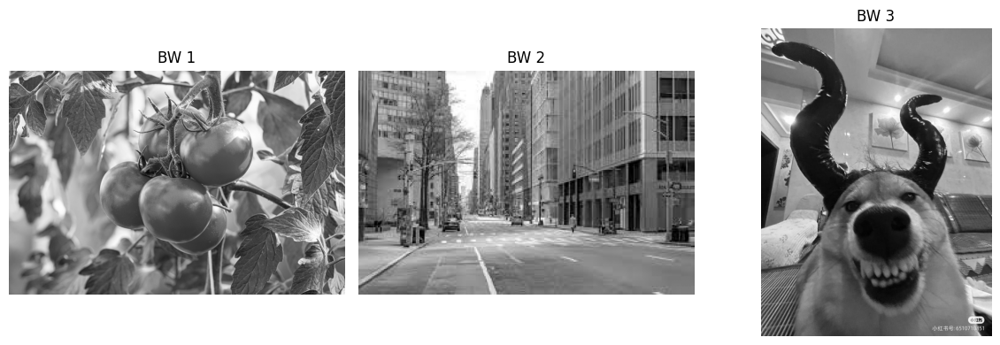

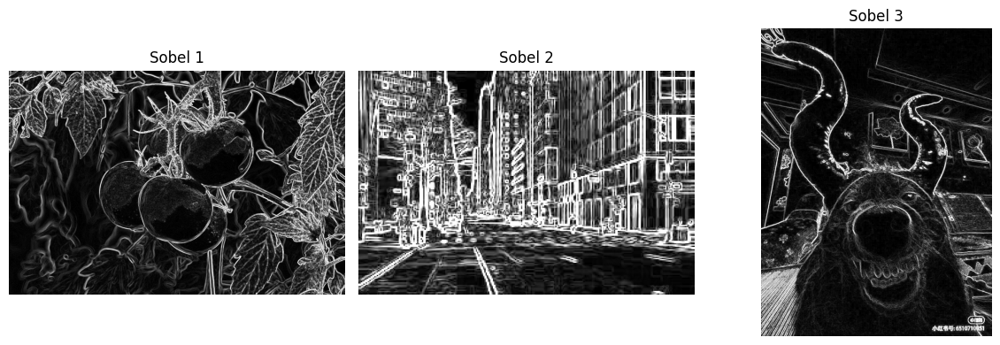

In [14]:
sobel_images = []

for img in images_bw:
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)

    sobel = cv2.magnitude(sobel_x, sobel_y)

    sobel_uint8 = cv2.convertScaleAbs(sobel)

    sobel_images.append(sobel_uint8)

show_images(images_bw, ["BW 1", "BW 2", "BW 3"])
show_images(sobel_images, ["Sobel 1", "Sobel 2", "Sobel 3"])


## Геометрические преобразования

### Циклический сдвиг пикселей (по горизонтали и по вертикали)

Тут мы сдвигаем пиксели, а те, которые остаются за бортом, появляются с другой стороны. Чтобы такое замутить, можно использовать функцию roll из пакета numpy. 

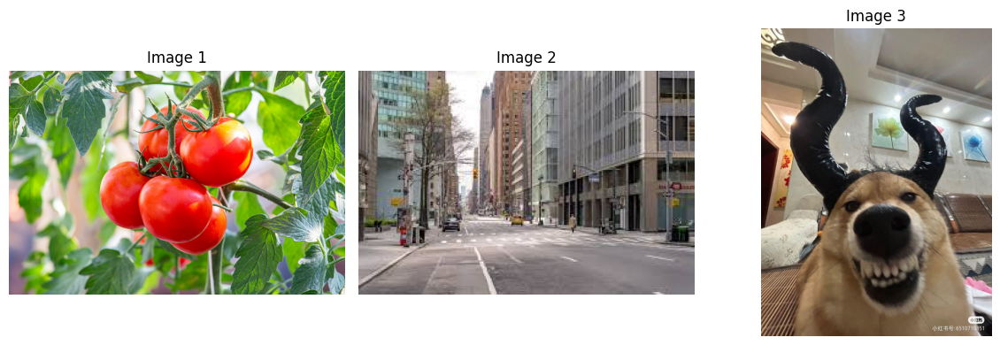

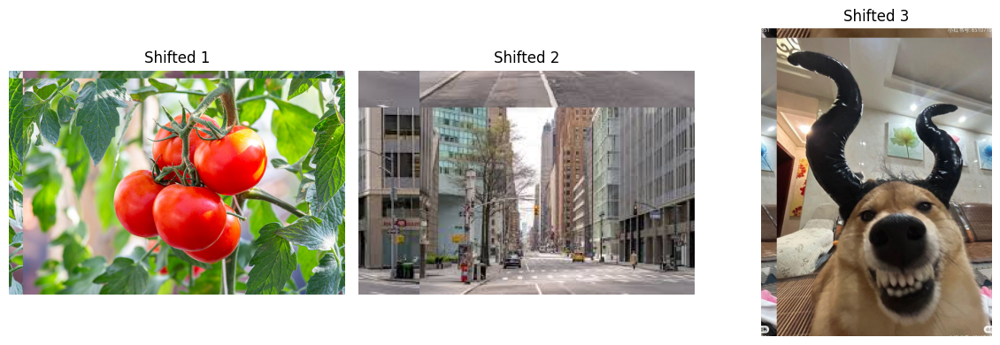

In [15]:
shifted_images = []

dx = 50  # сдвиг по горизонтали (вправо)
dy = 30  # сдвиг по вертикали (вниз)

for img in images:
    shifted = np.roll(img, shift=(dy, dx), axis=(0, 1))
    shifted_images.append(shifted)

show_images(images, ["Image 1", "Image 2", "Image 3"])
show_images(shifted_images, [f"Shifted 1", f"Shifted 2", f"Shifted 3"])


### Поворот изображения относительно произвольного центра

Чтобы повернуть изображение на угол θ вокруг произвольного центра (cx, cy), нам нужна аффинная матрица трансформации. В OpenCV это делается функцией getRotationMatrix2D, куда передаются центр поворота, угол в градусах (положительный = по часовой стрелке) и масштаб (1.0 = без изменения размера). 

[[   0.70710678    0.70710678 -107.10678119]
 [  -0.70710678    0.70710678  541.42135624]]
[[  0.70710678   0.70710678 -24.22034611]
 [ -0.70710678   0.70710678 123.52691193]]
[[   0.70710678    0.70710678 -238.69761826]
 [  -0.70710678    0.70710678  403.7329727 ]]


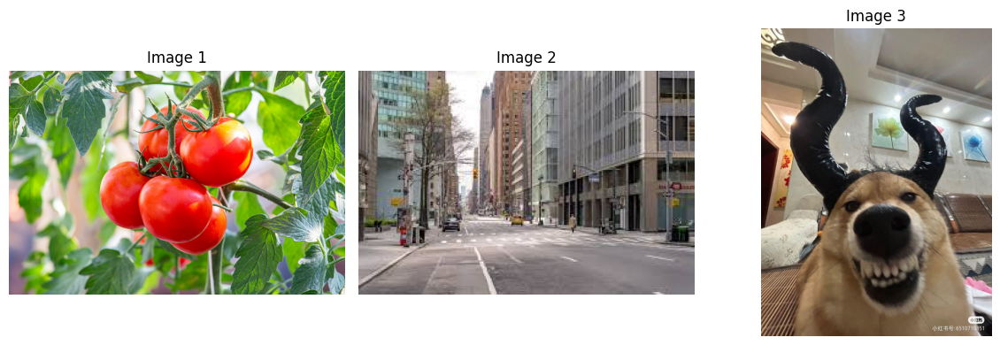

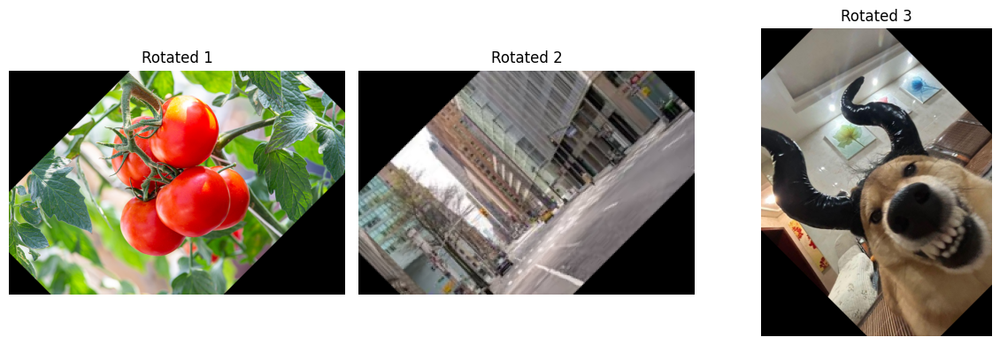

In [16]:
rotated_images = []

angle = 45  # угол поворота в градусах
scale = 1.0 # масштаб (1.0 = без изменения размера)

for img in images:
    h, w = img.shape[:2]
    center = (w//2, h//2)  

    M = cv2.getRotationMatrix2D(center, angle, scale)

    print(M)

    rotated = cv2.warpAffine(img, M, (w, h))
    rotated_images.append(rotated)

show_images(images, ["Image 1", "Image 2", "Image 3"])
show_images(rotated_images, [f"Rotated 1", f"Rotated 2", f"Rotated 3"])


# Лабораторная работа 2

## Вычисление прямых линий и окружностей

Оно делается на основание метода Хафа. Сначала надо найти контуры изображения (к примеру, с помощью того же Собеля), а затем определить, где находятся линии или окуржности. Для того, чтобы учитывались и вертикальные линии в том числе, привычная формула y = kx + b нам не подходит, потому k - тангенс от угла наклона, а тангенса от 90 градусов попросту нет. 

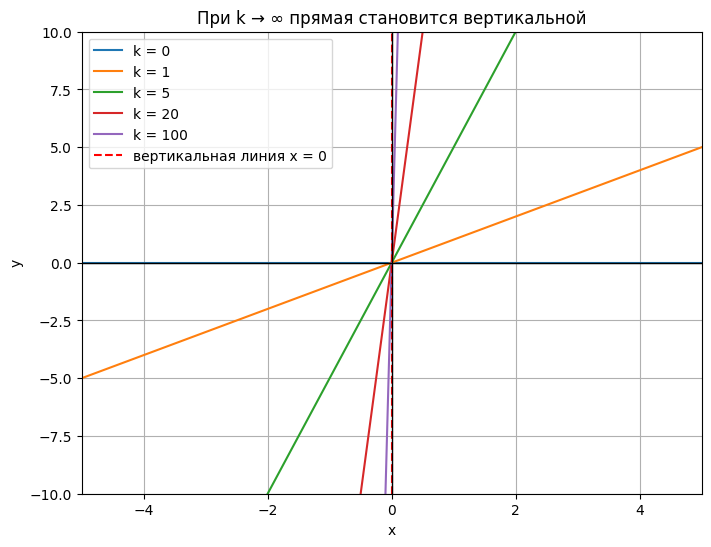

In [17]:
x = np.linspace(-5, 5, 400)

# Разные значения углового коэффициента k
k_values = [0, 1, 5, 20, 100]

plt.figure(figsize=(8, 6))

# Строим линии y = kx
for k in k_values:
    y = k * x
    plt.plot(x, y, label=f'k = {k}')

# Добавляем вертикальную линию (x = 0)
plt.axvline(x=0, color='red', linestyle='--', label='вертикальная линия x = 0')

# Настройки графика
plt.xlim(-5, 5)
plt.ylim(-10, 10)
plt.axhline(0, color='black', linewidth=1)
plt.axvline(0, color='black', linewidth=1)
plt.xlabel('x')
plt.ylabel('y')
plt.title('При k → ∞ прямая становится вертикальной')
plt.legend()
plt.grid(True)

# Показать график
plt.show()

Поэтому в этом алгоритме используется полярная система координат. Точка задается двумя величинами - расстояние до начала координат и угол наклона. Линия задаётся уравнением r=xcosφ+ysinφ. Идея примерно в том, чтобы пройтись по каждому пикселю края и нарисовать для них свою линию-синусоиду. И там, где будет много этих линий-точек пересекаться, там вероятно и находится линия.

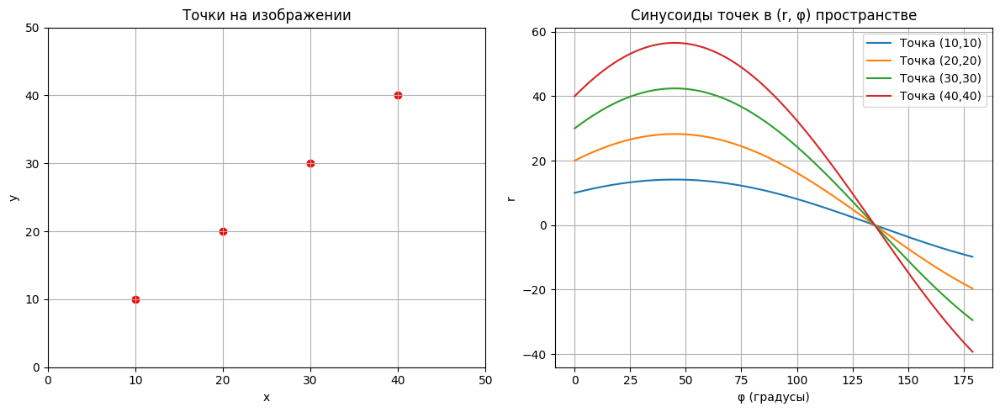

In [18]:
# Создаем простое изображение с несколькими точками границы
points = np.array([[10, 10], [20, 20], [30, 30], [40, 40]])  # точки на линии y=x

# Диапазон углов в радианах
phi = np.deg2rad(np.arange(0, 180, 1))
r_max = int(np.hypot(50, 50))  # максимальное возможное r
r = np.linspace(-r_max, r_max, 2*r_max)

# Создаем аккумулятор (для демонстрации можно обойтись без полноценного массива)
plt.figure(figsize=(12, 5))

# Левая часть: точки на изображении
plt.subplot(1, 2, 1)
plt.scatter(points[:,0], points[:,1], color='red')
plt.title("Точки на изображении")
plt.xlabel("x")
plt.ylabel("y")
plt.xlim(0, 50)
plt.ylim(0, 50)
plt.grid(True)

# Правая часть: синусоиды точек в r-phi пространстве
plt.subplot(1, 2, 2)
for x, y in points:
    r_values = x * np.cos(phi) + y * np.sin(phi)
    plt.plot(np.rad2deg(phi), r_values, label=f"Точка ({x},{y})")
plt.title("Синусоиды точек в (r, φ) пространстве")
plt.xlabel("φ (градусы)")
plt.ylabel("r")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

В openCV для обнаружения линий используем функцию HoughLinesP. 

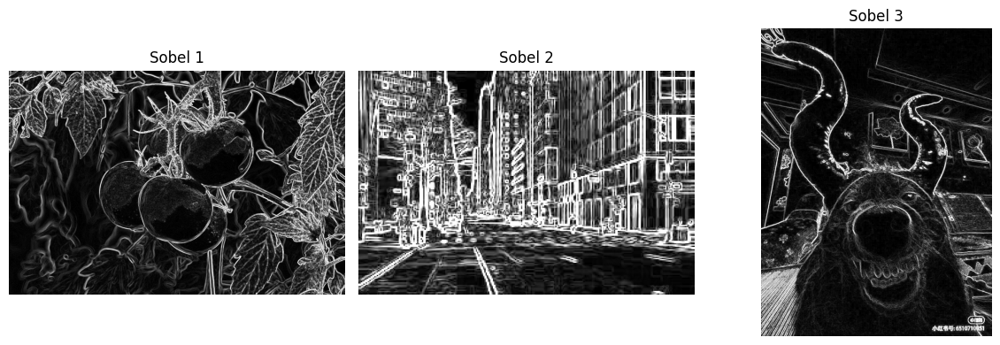

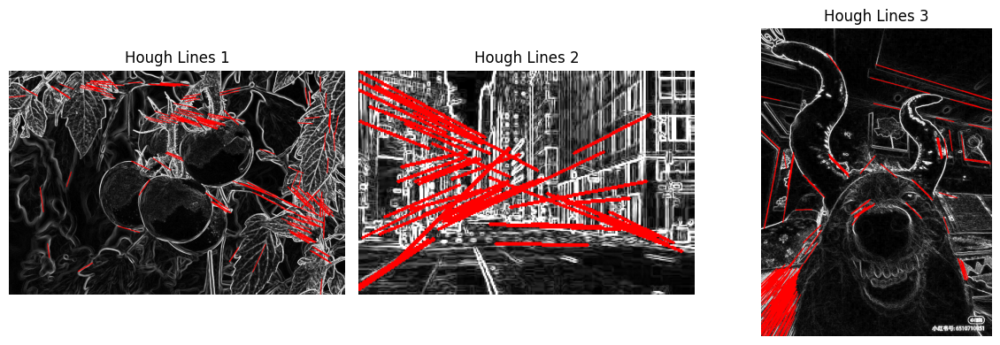

In [19]:
hough_images = []

for img in sobel_images:
    _, edges = cv2.threshold(img, 50, 255, cv2.THRESH_BINARY)

    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=120, minLineLength=50, maxLineGap=1)

    theta_vals = np.linspace(0, np.pi, 180)

    img_hough = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(img_hough, (x1, y1), (x2, y2), (0, 0, 255), 2)

    hough_images.append(img_hough)

show_images(sobel_images, ["Sobel 1", "Sobel 2", "Sobel 3"])
show_images(hough_images, ["Hough Lines 1", "Hough Lines 2", "Hough Lines 3"])


In [20]:
def plot_hough_sinusoids(img, max_points=200, title="Hough Transform - Pixel Sinusoids"):
    """
    Рисует график синусоид каждого пикселя границы в Hough-пространстве.
    
    Параметры:
    - img: изображение (numpy array, grayscale)
    - max_points: максимум точек границы для отображения (для читаемости)
    - title: заголовок графика
    """
    # 1. Нормализация
    img_norm = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    
    # 2. Порог для выделения границ
    _, edges = cv2.threshold(img_norm, 50, 255, cv2.THRESH_BINARY)
    
    # 3. Параметры θ
    theta_vals = np.linspace(0, np.pi, 180)
    
    # 4. Пиксели границы
    ys, xs = np.nonzero(edges)
    
    if len(xs) == 0:
        print("Нет пикселей границы для отображения!")
        return
    
    # 5. Выбираем максимум max_points точек для наглядности
    sample_indices = np.linspace(0, len(xs)-1, min(max_points, len(xs))).astype(int)
    
    plt.figure(figsize=(8,6))
    
    for sidx in sample_indices:
        x = xs[sidx]
        y = ys[sidx]
        # Синусоида для каждого пикселя: rho = x*cos(theta) + y*sin(theta)
        rhos = x * np.cos(theta_vals) + y * np.sin(theta_vals)
        plt.plot(np.rad2deg(theta_vals), rhos, color='blue', alpha=0.3)
    
    plt.xlabel("Theta (degrees)")
    plt.ylabel("Rho (pixels)")
    plt.title(title)
    plt.grid(True)
    plt.show()

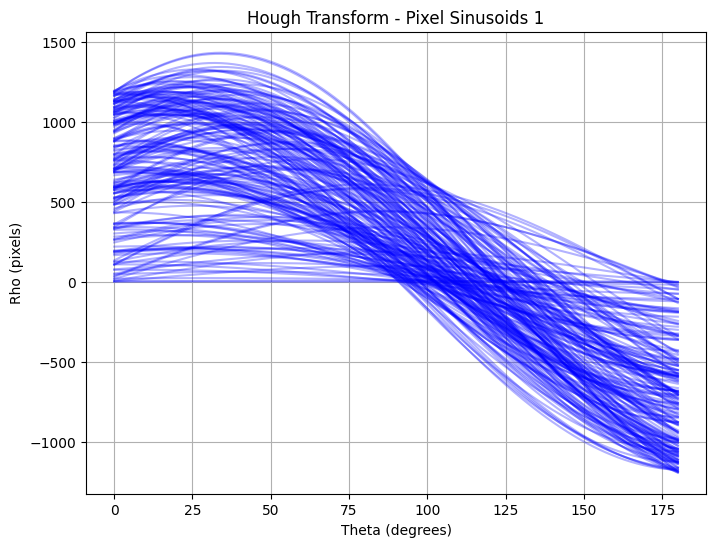

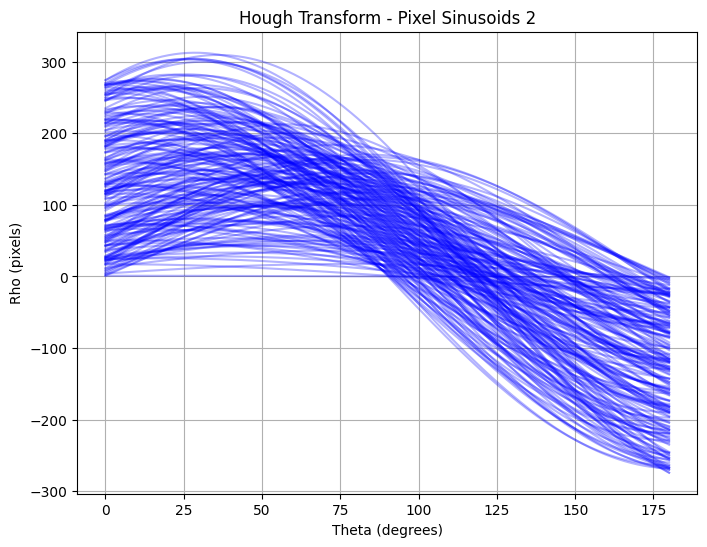

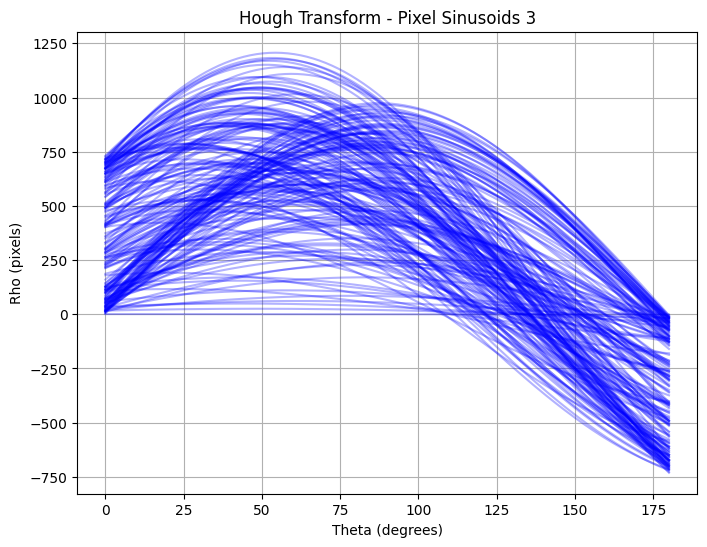

In [21]:
for idx, img in enumerate(sobel_images):
    plot_hough_sinusoids(img, max_points=200, title=f"Hough Transform - Pixel Sinusoids {idx+1}")

Теперь перейдём к окружностям. Чтобы описать окружность, нужны три параметра: координаты центра и радиус. Для каждого пикселя границы мы предполагаем несколько возможных радиусов и пытаемся понять, где может быть центр окружности, проходящей через этот пиксель.

Для этого вокруг каждого пикселя воображаемо строим окружность с выбранным радиусом. Каждая точка на этой воображаемой окружности — это возможное положение центра настоящей окружности.

Дальше каждый пиксель “ставит голос” за все эти возможные центры. После того как все пиксели проголосовали, те точки, за которые проголосовало больше всего пикселей, становятся вероятными центрами настоящих окружностей.

Иными словами, чем больше пикселей согласны на один и тот же центр и радиус, тем выше вероятность, что именно там есть окружность. Hough Transform превращает задачу нахождения центра и радиуса в задачу поиска пиков голосов от всех пикселей границы.

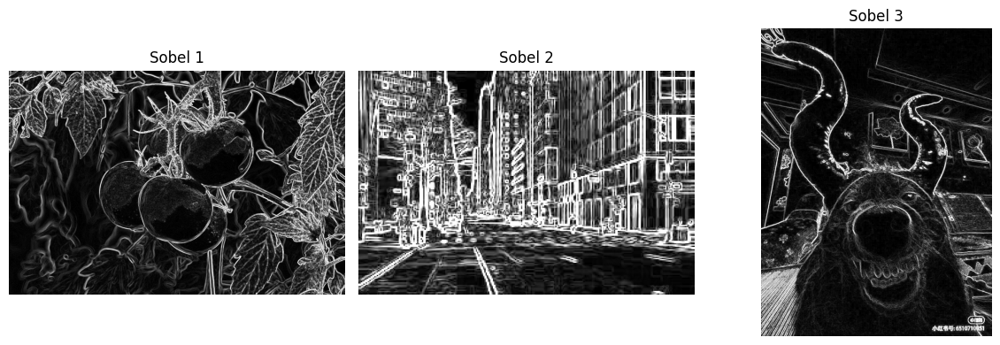

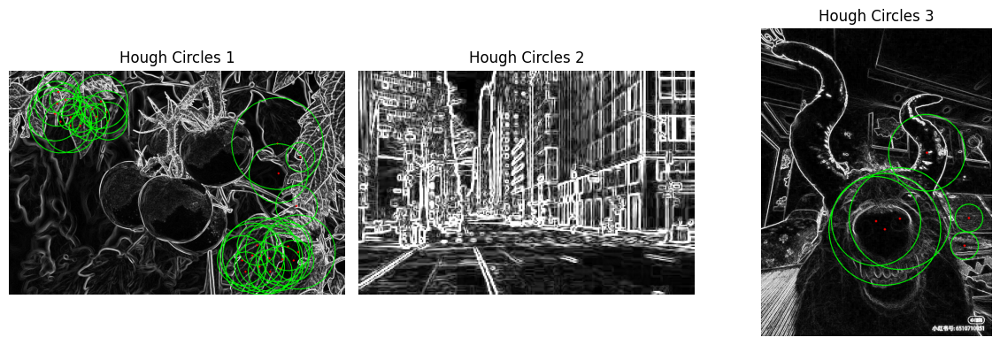

In [35]:
hough_circle_images = []

# Параметры HoughCircles
dp = 1                 # масштабирование аккумулятора
min_dist = 30          # минимальное расстояние между центрами
param1 = 80            # порог для Canny (внутри HoughCircles)
param2 = 55            # порог для голосов (чем больше, тем меньше ложных)
min_radius = 20        # минимальный радиус окружности
max_radius = 200        # максимальный радиус окружности

for idx, img in enumerate(sobel_images):
    # 1. Нормализация
    img_norm = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # 2. Лёгкое размытие, чтобы убрать шум
    img_blur = cv2.GaussianBlur(img_norm, (5, 5), 0)

    # 3. Порог для выделения сильных границ
    _, edges = cv2.threshold(img_blur, 50, 255, cv2.THRESH_BINARY)

    # 4. Поиск окружностей
    circles = cv2.HoughCircles(
        edges,
        cv2.HOUGH_GRADIENT,
        dp=dp,
        minDist=min_dist,
        param1=param1,
        param2=param2,
        minRadius=min_radius,
        maxRadius=max_radius
    )

    # 5. Копия изображения для рисования
    img_hough = cv2.cvtColor(img_norm, cv2.COLOR_GRAY2BGR)

    # 6. Рисуем найденные окружности
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for c in circles[0, :]:
            center = (c[0], c[1])
            radius = c[2]
            # рисуем окружность
            cv2.circle(img_hough, center, radius, (0, 255, 0), 2)
            # рисуем центр
            cv2.circle(img_hough, center, 2, (0, 0, 255), 3)

    # 7. Сохраняем результат
    hough_circle_images.append(img_hough)

# 8. Показ Sobel и изображений с окружностями
show_images(sobel_images, ["Sobel 1", "Sobel 2", "Sobel 3"])
show_images(hough_circle_images, ["Hough Circles 1", "Hough Circles 2", "Hough Circles 3"])


## Локальные статистические признаки

Локальные статистические признаки — это численные характеристики маленьких участков изображения (например, окна 3×3, 5×5 пикселей), которые описывают распределение яркости или цвета. Например, среднее значение, дисперсия, максимум, минимум, энтропия. 

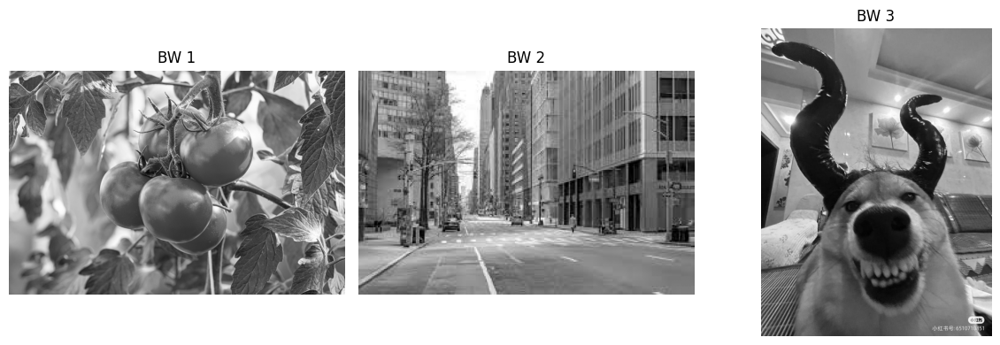

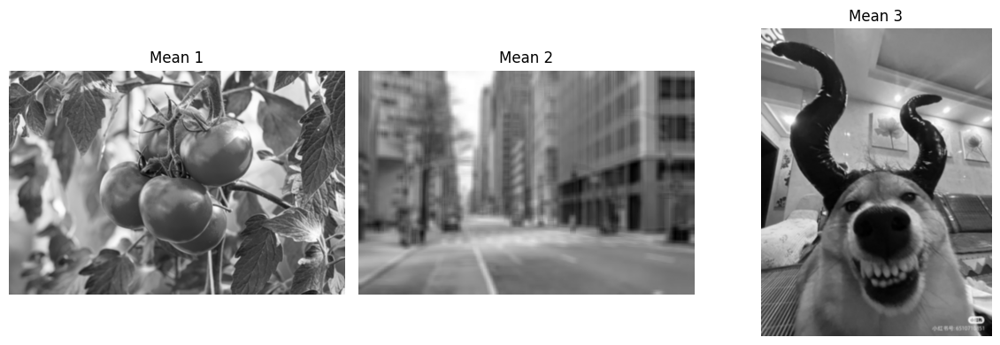

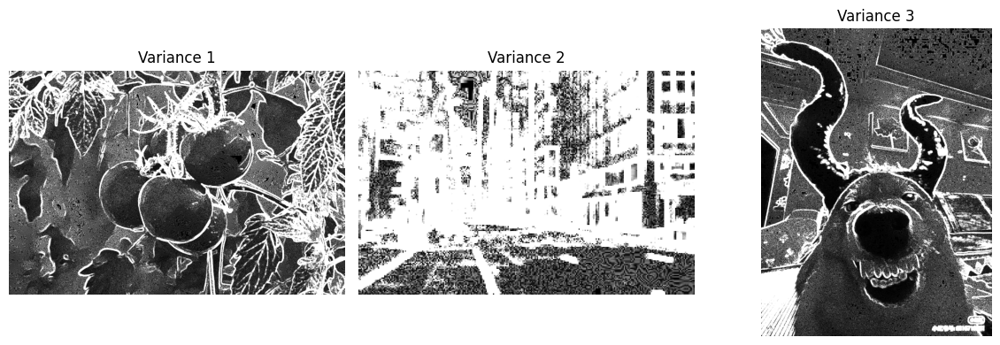

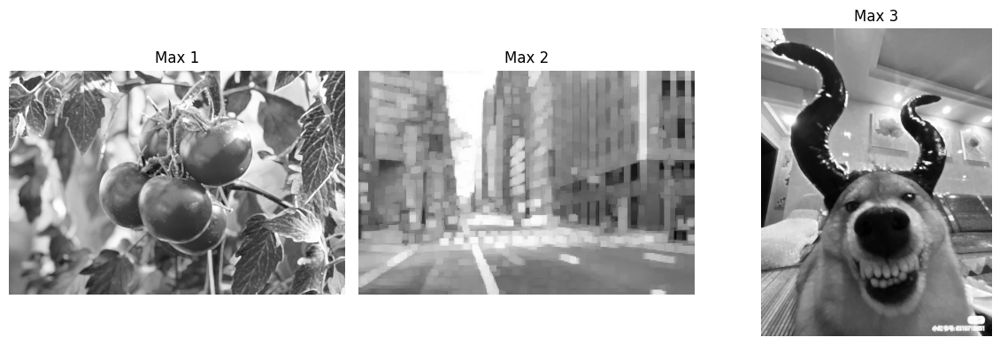

In [23]:
local_mean_images = []
local_var_images = []
local_max_images = []

# Размер окна для локальных признаков
window_size = 5

for img in images_bw:
    # Локальное среднее
    mean = cv2.blur(img, (window_size, window_size))

    # Локальная дисперсия: var = E[x^2] - (E[x])^2
    sqr_img = img.astype(np.float32)**2
    mean_sqr = cv2.blur(sqr_img, (window_size, window_size))
    variance = mean_sqr - mean.astype(np.float32)**2
    variance_uint8 = cv2.convertScaleAbs(variance)

    # Локальный максимум
    max_img = cv2.dilate(img, np.ones((window_size, window_size), np.uint8))

    local_mean_images.append(mean)
    local_var_images.append(variance_uint8)
    local_max_images.append(max_img)

# Показываем исходные и признаки
show_images(images_bw, ["BW 1", "BW 2", "BW 3"])
show_images(local_mean_images, ["Mean 1", "Mean 2", "Mean 3"])
show_images(local_var_images, ["Variance 1", "Variance 2", "Variance 3"])
show_images(local_max_images, ["Max 1", "Max 2", "Max 3"])


## Сегментация

Идея в том, чтобы выбрать точку затравки, а дальше искать соседние пиксели, у которых математические признаки похожие на эту точку. 

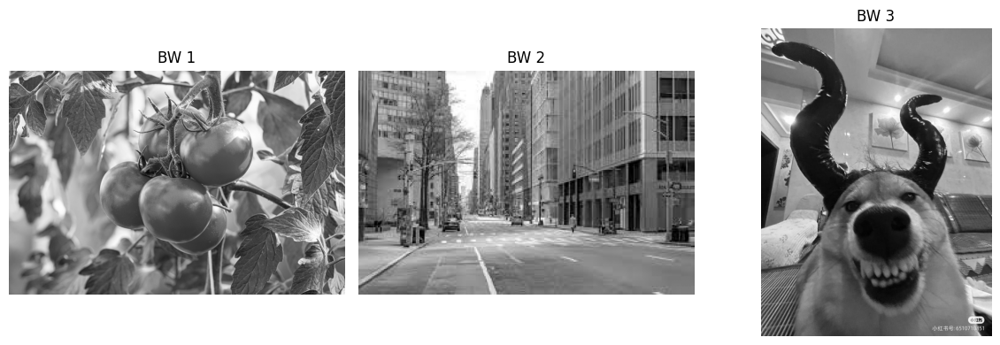

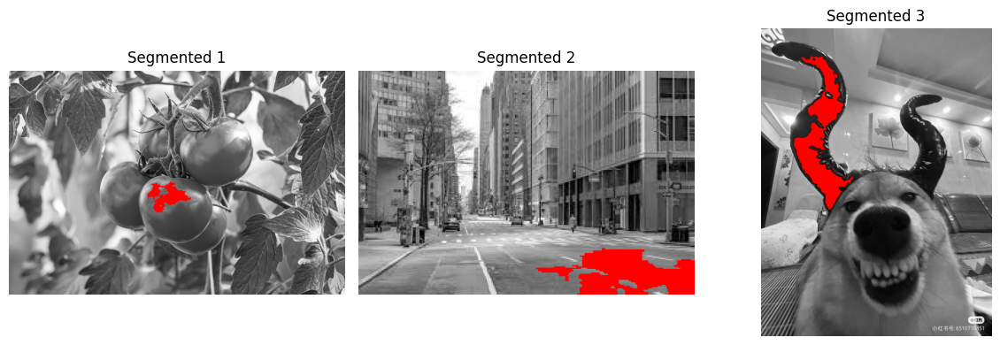

In [24]:
from collections import deque

# 1. Функция для вычисления локальных признаков
def compute_local_features(img, x, y, window_size=7):
    h, w = img.shape
    half = window_size // 2
    x1, y1 = max(0, x-half), max(0, y-half)
    x2, y2 = min(w, x+half+1), min(h, y+half+1)
    patch = img[y1:y2, x1:x2].astype(np.float32)
    mean = np.mean(patch)
    var = np.var(patch)
    max_val = np.max(patch)
    return np.array([mean, var, max_val])

# 2. Region growing
def region_growing(img, seed_point, threshold=25, window_size=7):
    h, w = img.shape
    mask = np.zeros((h, w), np.uint8)
    seed_feat = compute_local_features(img, seed_point[0], seed_point[1], window_size)
    queue = deque()
    queue.append(seed_point)
    mask[seed_point[1], seed_point[0]] = 255
    directions = [(-1,0),(1,0),(0,-1),(0,1), (-1,-1),(1,1),(-1,1),(1,-1)]
    while queue:
        x, y = queue.popleft()
        for dx, dy in directions:
            nx, ny = x+dx, y+dy
            if 0 <= nx < w and 0 <= ny < h and mask[ny, nx] == 0:
                feat = compute_local_features(img, nx, ny, window_size)
                dist = np.linalg.norm(seed_feat - feat)
                if dist < threshold:
                    mask[ny, nx] = 255
                    queue.append((nx, ny))
    return mask

# 3. Задаем точки затравки для каждой картинки
seed_points = [(525, 426), (212, 158), (199, 465)]  

# 4. Цветное выделение сегментов
colored_segments = []

for img, seed in zip(images_bw, seed_points):
    mask = region_growing(img, seed, threshold=25, window_size=7)
    img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    img_color[mask==255] = [0, 0, 255]  # красные пиксели сегмента
    colored_segments.append(img_color)


# 6. Показываем результат
show_images(images_bw, ["BW 1", "BW 2", "BW 3"])
show_images(colored_segments, ["Segmented 1", "Segmented 2", "Segmented 3"])


In [25]:
seed_point = []

def click_event(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        seed_point.append((x, y))
        print("Выбрана точка:", x, y)

cv2.imshow("Выберите точку", images_bw[2])
cv2.setMouseCallback("Выберите точку", click_event)
cv2.waitKey(0)
cv2.destroyAllWindows()
